In [1]:
# Install package
%pip install --upgrade git+git://github.com/rahulspsec/portfoliotools.git

  Cloning git://github.com/rahulspsec/portfoliotools.git to c:\users\isakek~1\appdata\local\temp\pip-req-build-2wnklmi7
Note: you may need to restart the kernel to use updated packages.


  Running command git clone -q git://github.com/rahulspsec/portfoliotools.git 'C:\Users\ISAKEK~1\AppData\Local\Temp\pip-req-build-2wnklmi7'
  fatal: remote error:
    Repository not found.
ERROR: Command errored out with exit status 128: git clone -q git://github.com/rahulspsec/portfoliotools.git 'C:\Users\ISAKEK~1\AppData\Local\Temp\pip-req-build-2wnklmi7' Check the logs for full command output.


In [2]:
from portfoliotools.screener.stock_screener import StockScreener
from portfoliotools.screener.utility.util import get_ticker_list, getHistoricStockPrices, get_nse_index_list, get_port_ret_vol_sr
from portfoliotools.screener.stock_screener import PortfolioStrategy, ADF_Reg_Model
from tqdm import tqdm
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from IPython.display import display_html
from pandas.plotting import register_matplotlib_converters
from plotly.subplots import make_subplots
from datetime import datetime
import warnings
warnings.filterwarnings("ignore")
register_matplotlib_converters()
%matplotlib inline
sns.set()
pd.options.display.max_columns = None
pd.options.display.max_rows = None

#### Select list of stocks

In [3]:
tickers = get_ticker_list()
stock_list = [ticker['Ticker'] for ticker in tickers]
stock_list.remove("GAIL")
calc_screener = False
#stock_list = ['ICICIBANK', 'HDFC', 'HDFCBANK', 'INFY', 'RELIANCE', 'ASIANPAINT', 'TCS', 'MARUTI', 'TATAMOTORS', 'CIPLA']
#stock_list = ['INFY', 'SBIN', 'HDFC', 'HDFCBANK', 'NATIONALUM']


cob = datetime(2020,2,1) # COB Date

### <font color = 'red'>Screener Results</font>

In [4]:
if calc_screener:
    result = None
    for stock in tqdm(stock_list):
        obj = StockScreener(stock_list= [stock], cob=cob)
        temp_result = obj.get_summary()
        if result is None: result = temp_result
        else: result = result.append(temp_result)

    result.index = result['Stock Name']
    result.drop('Stock Name', inplace = True, axis = 1)
    result = result.transpose() 
    result

### <font color = 'red'>Portfolio Strategy Tools</font>

### <font color = 'blue'>Stocks</font>

In [5]:
asset_list = stock_list

In [20]:
asset_list

['ADANIPORTS',
 'ASIANPAINT',
 'AXISBANK',
 'BAJAJ-AUTO',
 'BAJFINANCE',
 'BAJAJFINSV',
 'BHARTIARTL',
 'INFRATEL',
 'BPCL',
 'BRITANNIA',
 'CIPLA',
 'COALINDIA',
 'DRREDDY',
 'EICHERMOT',
 'GRASIM',
 'HCLTECH',
 'HDFC',
 'HDFCBANK',
 'HDFCLIFE',
 'HEROMOTOCO',
 'HINDALCO',
 'HINDUNILVR',
 'ICICIBANK',
 'INDUSINDBK',
 'INFY',
 'IOC',
 'ITC',
 'JSWSTEEL',
 'KOTAKBANK',
 'LT',
 'M&M',
 'MARUTI',
 'NESTLEIND',
 'NTPC',
 'ONGC',
 'POWERGRID',
 'RELIANCE',
 'SBIN',
 'SHREECEM',
 'SUNPHARMA',
 'TATAMOTORS',
 'TATASTEEL',
 'TCS',
 'TECHM',
 'TITAN',
 'ULTRACEMCO',
 'UPL',
 'WIPRO',
 'ZEEL']

In [6]:
strat = PortfolioStrategy(asset_list, period = 1000, cob = cob)

#### Correlation Matrix

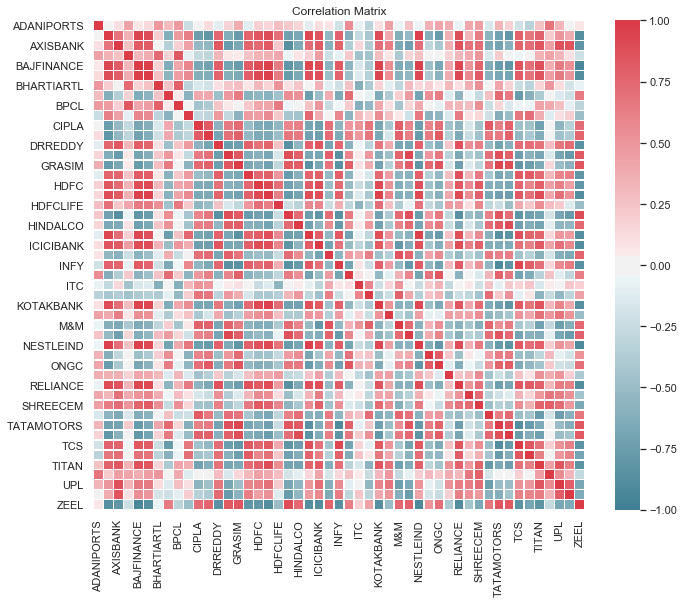

In [7]:
fig = strat.plot_correlation_matrix()
fig.show()

#### Correlated Stocks

In [8]:
corr_pair = strat.get_correlation_pair()
print("Highly Correlated:")
display_html(corr_pair[corr_pair['Correlation'] > .95])
print("\nInversely Correlated:")
display_html(corr_pair[corr_pair['Correlation'] < -.90])

Highly Correlated:


,Stock 1,Stock 2,Correlation
0,BAJFINANCE,BAJAJFINSV,0.975563
1,BAJFINANCE,HDFCBANK,0.968052
2,BAJAJFINSV,HDFCBANK,0.967538
3,ASIANPAINT,NESTLEIND,0.967067
4,HINDUNILVR,NESTLEIND,0.961605
5,HDFCBANK,KOTAKBANK,0.959320
6,BAJFINANCE,NESTLEIND,0.958924



Inversely Correlated:


,Stock 1,Stock 2,Correlation
1173,INFY,TATAMOTORS,-0.902381
1174,NESTLEIND,ZEEL,-0.906780
1175,BAJFINANCE,ZEEL,-0.933360


#### <font color = 'red'>Efficient Frontier</font>

In [9]:
market_portfolio = strat.get_efficient_market_portfolio(plot = True, num_ports = 50000, show_frontier =True) #plot =True to plot Frontier

#### Market Portfolio

,MP
BAJFINANCE (%),11.2900
HDFCBANK (%),0.4500
HDFCLIFE (%),5.3200
HINDUNILVR (%),17.9200
ICICIBANK (%),3.8300
INFY (%),7.1900
KOTAKBANK (%),3.8000
NESTLEIND (%),15.4100
RELIANCE (%),8.4200
TCS (%),14.8200


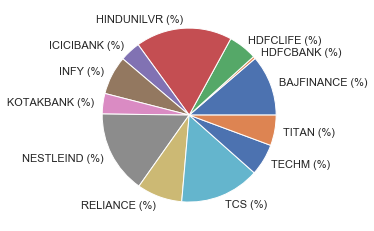

In [10]:
market_portfolio = market_portfolio.T
market_portfolio = market_portfolio[market_portfolio['MP'] != 0.00]
plt.pie(market_portfolio.iloc[:-3,0], labels=market_portfolio.index.tolist()[:-3])
market_portfolio

**Ticker Details**

In [11]:
strat.get_details()

,Name,Return,Risk,Sharpe
0,ADANIPORTS,0.033766,0.308436,0.109474
1,ASIANPAINT,0.167859,0.216184,0.776465
2,AXISBANK,0.136971,0.276292,0.495746
3,BAJAJ-AUTO,0.063438,0.226703,0.279831
4,BAJFINANCE,0.463351,0.326024,1.421217
5,BAJAJFINSV,0.284075,0.292572,0.970957
6,BHARTIARTL,0.170129,0.338538,0.502541
7,INFRATEL,-0.091255,0.363108,-0.251315
8,BPCL,0.034168,0.376387,0.090778
9,BRITANNIA,0.229855,0.222235,1.034291


### <font color = 'blue'>Index</font>

In [12]:
#get_nse_index_list()

In [12]:
index_list_sector = ['NIFTY BANK', 'NIFTY PHARMA', 'NIFTY FMCG',
             'NIFTY IT','NIFTY AUTO', 'NIFTY MEDIA', 'NIFTY METAL']
index_list_market_cap = ['NIFTY 50', 'NIFTY MIDCAP 50', 'NIFTY SMLCAP 100']
index_list = index_list_sector#index_list_market_cap

In [13]:
strat = PortfolioStrategy(index_list, period = 1000, cob = cob)

**Correlation Matrix**

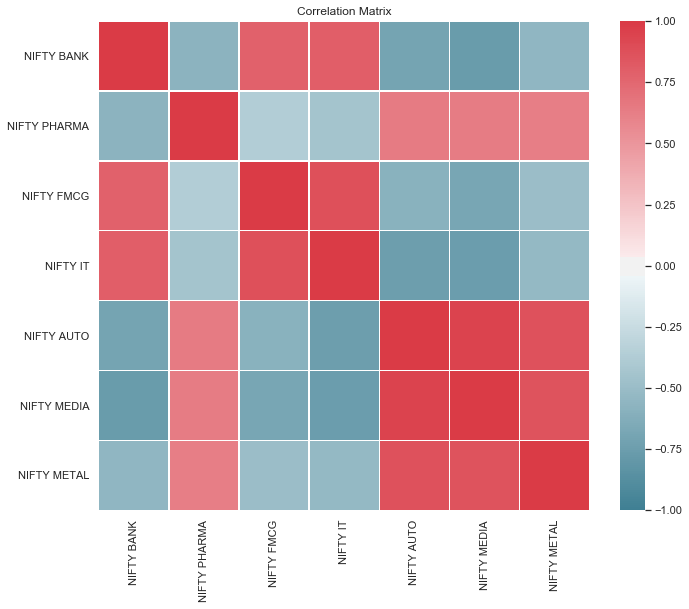

In [14]:
fig = strat.plot_correlation_matrix()
fig.show()

**Highly Correlated**

In [15]:
corr_pair = strat.get_correlation_pair()
print("Highly Correlated:")
display_html(corr_pair[corr_pair['Correlation'] > .90])
print("\nInversely Correlated:")
display_html(corr_pair[corr_pair['Correlation'] < -.70])

Highly Correlated:


,Stock 1,Stock 2,Correlation
0,NIFTY AUTO,NIFTY MEDIA,0.951994



Inversely Correlated:


,Stock 1,Stock 2,Correlation
18,NIFTY IT,NIFTY AUTO,-0.743496
19,NIFTY IT,NIFTY MEDIA,-0.755882
20,NIFTY BANK,NIFTY MEDIA,-0.765420


#### <font color = 'red'>Efficient Frontier</font>

In [16]:
market_portfolio = strat.get_efficient_market_portfolio(plot = True, num_ports = 50000, show_frontier =False) #plot =True to plot Frontier

#### Market Portfolio (Index)

,MP
NIFTY BANK (%),21.3000
NIFTY FMCG (%),20.0700
NIFTY IT (%),58.6300
Return,0.1420
Risk,0.1171
Sharpe,1.2120


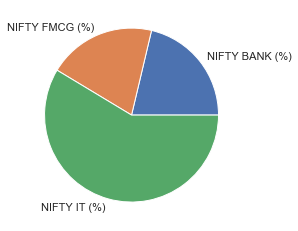

In [17]:
market_portfolio = market_portfolio.T
market_portfolio = market_portfolio[market_portfolio['MP'] != 0.00]
plt.pie(market_portfolio.iloc[:-3,0], labels=market_portfolio.index.tolist()[:-3])
market_portfolio

#### Return, Risk, Sharpe (Individual)

In [18]:
strat.get_details()

,Name,Return,Risk,Sharpe
0,NIFTY BANK,0.100310,0.165468,0.606221
1,NIFTY PHARMA,-0.083082,0.199772,-0.415881
2,NIFTY FMCG,0.094107,0.146615,0.641868
3,NIFTY IT,0.173507,0.162921,1.064973
4,NIFTY AUTO,-0.094699,0.195738,-0.483805
5,NIFTY MEDIA,-0.213656,0.261372,-0.817440
6,NIFTY METAL,-0.052171,0.245644,-0.212383


#### Screener Details

In [19]:
strat.get_screener_details()

ERROR:root:Error fetching 52 week high - NIFTY BANK
ERROR:root:Error fetching 52 week low - NIFTY BANK
ERROR:root:Error fetching 52 week low - NIFTY BANK
ERROR:root:Error fetching 52 week high - NIFTY BANK
ERROR:root:Error fetching 52 week low - NIFTY BANK
ERROR:root:Error fetching 52 week low - NIFTY BANK
ERROR:root:Error fetching 52 week high - NIFTY BANK
ERROR:root:Error fetching 52 week low - NIFTY BANK
ERROR:root:Error calculating William's R - NIFTY BANK
ERROR:root:Error generating MacD details - NIFTY BANK
ERROR:root:Error calculating Renko Results - NIFTY BANK
ERROR:root:Error fetching 52 week high - NIFTY PHARMA
ERROR:root:Error fetching 52 week low - NIFTY PHARMA
ERROR:root:Error fetching 52 week low - NIFTY PHARMA
ERROR:root:Error fetching 52 week high - NIFTY PHARMA
ERROR:root:Error fetching 52 week low - NIFTY PHARMA
ERROR:root:Error fetching 52 week low - NIFTY PHARMA
ERROR:root:Error fetching 52 week high - NIFTY PHARMA
ERROR:root:Error fetching 52 week low - NIFTY PHARM

,Stock Name,Date,Last Close,Last COB,Average Volume,Standard Deviation,CAGR,Annual Volatility,Sharpe,Sortino,52W High,52W Low,Price% 52 Week,Price per Range,Return 1D,Return 1W,Return 1M,Return 1Y,Smoothing Period,Lookback Period,%R,%D,WilliamR Signal,WilliamR Passive Portfolio,WilliamR Active Portfolio,30D Moving Average,60D Moving Average,200D Moving Average,12D Exponential Moving Average,26D Exponential Moving Average,MACD Line,MACD Indicator,MACD Line to Indicator Diff (Value),MACD Line to Indicator Diff (Days),MACD Line to Indicator Diff Rolling Peak,MACD Line to Indicator Diff Rolling Peak per,MACD Signal,MACD Passive Portfolio,MACD Active Portfolio,Bollinger Band Upper,Bollinger Band Middle,Bollinger Band Lower,RSI Value,RSI Signal,RSI Passive Portfolio,RSI Active Portfolio,ATR Value,ADX Value,OBV Value,OBV Index,OBV Slope,OBV Signal,OBV Passive Portfolio,OBV Active Portfolio,Slope Value,Renko Trend,Renko Strength,Renko Signal,Renko Date,EarningYield,FCFYield,ROC,BookToMkt,DivYield,EPS Growth Rate,EPS,Yahoo 1 yr target,Intrinsic Value,Sector
0,NIFTY BANK,01Feb20,29820.90,01Feb20,2.471896e+08,452.24,8.94,18.18,0.299,0.515,-999,-999,1.797693e+308,100 %,-3.28,-3.30,-8.08,8.62,5,6,-999,-999,,-999,-999,31554.49,31549.66,30088.23,30859.63,31211.32,-999,-999,-999,-999,-999,-999,,-999,-999,31371.31,30562.52,29753.72,21.33,BUY,101.68,98.45,514.43,47.00,7.617625e+09,30.82,0.94,,104.54,101.71,-89.70,,-999,,,NaN,NaN,NaN,NaN,-999,NaN,-999,-999,NaN,
1,NIFTY PHARMA,01Feb20,8013.75,01Feb20,2.295574e+07,183.03,-6.90,19.57,-0.532,-0.842,-999,-999,1.797693e+308,100 %,-1.53,-4.78,-0.50,-9.98,5,6,-999,-999,,-999,-999,8152.74,8077.34,8134.27,8225.29,8185.45,-999,-999,-999,-999,-999,-999,,-999,-999,8543.01,8198.52,7854.03,22.48,BUY,103.05,107.46,514.43,44.44,-2.082734e+08,-9.07,-43.72,BUY,83.90,87.51,-89.47,,-999,,,NaN,NaN,NaN,NaN,-999,NaN,-999,-999,NaN,
2,NIFTY FMCG,01Feb20,30196.65,01Feb20,2.669341e+07,413.17,5.53,14.25,0.142,0.234,-999,-999,1.797693e+308,100 %,-1.88,-3.06,-0.23,-1.83,5,6,-999,-999,,-999,-999,30645.80,30733.69,30140.43,30911.96,30831.16,-999,-999,-999,-999,-999,-999,,-999,-999,31635.89,30804.05,29972.22,25.85,BUY,99.74,102.95,514.43,29.17,5.819683e+08,21.80,-46.98,,96.25,98.47,-89.75,,-999,,,NaN,NaN,NaN,NaN,-999,NaN,-999,-999,NaN,
3,NIFTY IT,01Feb20,16282.65,01Feb20,3.266271e+07,236.58,13.34,17.33,0.568,0.827,-999,-999,1.797693e+308,100 %,0.86,-0.68,3.65,13.81,5,6,-999,-999,,-999,-999,16097.83,15671.77,15704.40,16297.31,16142.56,-999,-999,-999,-999,-999,-999,,-999,-999,16549.21,16309.09,16068.98,47.99,,114.64,108.70,514.43,38.17,9.931909e+08,30.41,-8.70,,102.25,98.57,-89.09,,-999,,,NaN,NaN,NaN,NaN,-999,NaN,-999,-999,NaN,
4,NIFTY AUTO,01Feb20,7880.30,01Feb20,7.063264e+07,166.12,-17.48,21.78,-0.963,-1.560,-999,-999,1.797693e+308,100 %,-2.55,-4.58,-4.68,-11.08,5,8,-999,-999,,-999,-999,8199.80,8125.26,7861.49,8156.68,8172.96,-999,-999,-999,-999,-999,-999,,-999,-999,8382.38,8123.58,7864.78,25.48,BUY,90.44,101.62,514.43,28.35,-2.755992e+08,-3.90,-44.28,BUY,78.00,95.13,-89.16,,-999,,,NaN,NaN,NaN,NaN,-999,NaN,-999,-999,NaN,
5,NIFTY MEDIA,01Feb20,1755.90,01Feb20,4.368342e+07,67.00,-29.52,28.99,-1.139,-1.454,-999,-999,1.797693e+308,100 %,-4.33,-6.72,-2.49,-29.66,5,8,-999,-999,,-999,-999,1817.64,1819.27,1951.35,1837.56,1829.13,-999,-999,-999,-999,-999,-999,,-999,-999,1918.88,1833.85,1748.81,28.77,BUY,74.39,95.56,40.26,29.00,6.708199e+07,1.54,-23.58,BUY,59.32,77.31,-87.64,,-999,,,NaN,NaN,NaN,NaN,-999,NaN,-999,-999,NaN,
6,NIFTY METAL,01Feb20,2480.55,01Feb20,9.724964e+07,71.94,-21.85,25.77,-0.984,-1.600,-999,-999,1.797693e+308,100 %,-3.44,-8.46,-13.57,-16.51,5,8,-999,-999,,-999,-999,2770.25,2675.51,2676.12,2675.37,2716.91,-999,-999,-999,-999,-999,-999,,-999,-999,2842.05,2635.42,2428.79,17.38,BUY,75.90,84.22,40.26,44.54,-1.207083e+09,-12.41,-39.61,,81.65,86.91,-88.64,,-999,,,NaN,NaN,NaN,NaN,-999,NaN,-999,-999,NaN,
